# Task 1
Build the necessary datasets

In [5]:
# --- Imports libraries ---
import tensorflow as tf
import matplotlib.pyplot as plt
import pathlib
import os
import time
import datetime
from IPython import display
import urllib.request
import tarfile
import numpy as np
from skimage.metrics import structural_similarity as ssim


In [6]:
# Create a figures directory to store report images
if not os.path.exists('figures'):
    os.makedirs('figures')

In [7]:
# --- Set up dataset ---
dataset_name = "cityscapes"
_URL = f"http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz"
download_path = f"./{dataset_name}.tar.gz"
extract_dir = "./"

# --- Download the file ---
print(f"Downloading {_URL}...")
urllib.request.urlretrieve(_URL, download_path)

# --- Extract the file ---
print(f"Extracting to {extract_dir}...")
with tarfile.open(download_path, 'r:gz') as tar:
    tar.extractall(path=extract_dir)

# --- Set the path to the extracted dataset ---
PATH = pathlib.Path(f"./{dataset_name}")

print("Dataset path:", PATH)
print("Training samples:", len(list((PATH / 'train').glob('*.jpg'))))
print("Validation samples:", len(list((PATH / 'val').glob('*.jpg'))))

Extracting to ./...
Dataset path: cityscapes
Training samples: 2975
Validation samples: 500


Sample image shape: (256, 512, 3)


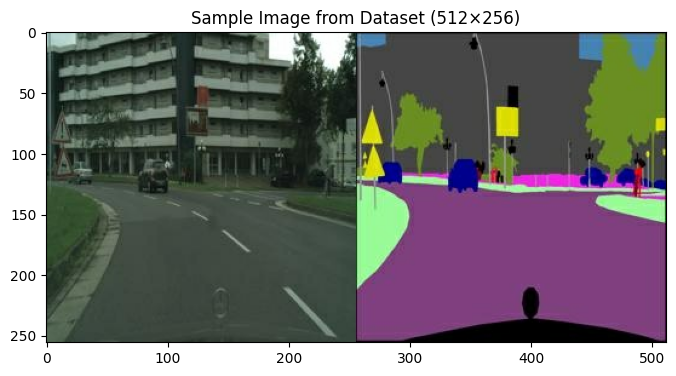

In [8]:
# --- Show a sample image (Figure 1a: Raw Dataset Sample) ---
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print("Sample image shape:", sample_image.shape)
plt.figure(figsize=(8, 8))
plt.imshow(sample_image)
plt.title("Sample Image from Dataset (512×256)")
plt.savefig('figures/fig1a_raw_sample.png', bbox_inches='tight')
plt.show()

In [9]:
# --- Define image dimensions ---
IMG_HEIGHT, IMG_WIDTH = 256, 256

# --- Split paired image (256x512) into input and target (256x256 each) ---
def load(image_file):
    """Load an image and split it into input and target portions."""
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)
    w = tf.shape(image)[1] // 2
    input_image = image[:, w:, :]  # Satellite (right half)
    real_image = image[:, :w, :]   # Map (left half)
    return tf.cast(input_image, tf.float32), tf.cast(real_image, tf.float32)

# --- Resize input images to a consistent size ---
def resize(input_image, real_image, height, width):
    """Resize both images to the desired dimensions."""
    input_image = tf.image.resize(input_image, [height, width])
    real_image = tf.image.resize(real_image, [height, width])
    return input_image, real_image

# --- Normalize image pixels to [-1, 1] ---
def normalize(input_image, real_image):
    """Normalize the images to [-1, 1] range."""
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1
    return input_image, real_image

# --- Add jitter: resize to 286x286, crop to 256x256, randomly flip ---
@tf.function
def random_jitter(input_image, real_image):
    """Apply random jittering to both images."""
    # Resize to larger than target size
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
        stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
    input_image, real_image = cropped_image[0], cropped_image[1]

    # Random mirroring
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

# --- Compose preprocessing functions ---
def load_image_train(image_file):
    """Load and preprocess a training image."""
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    return normalize(input_image, real_image)

def load_image_test(image_file):
    """Load and preprocess a test image."""
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
    return normalize(input_image, real_image)


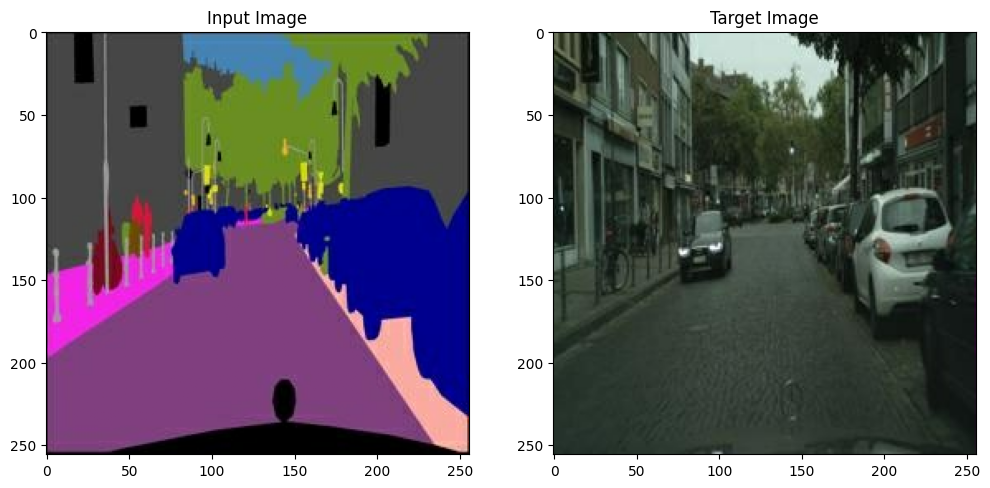

In [10]:
# --- Figure 1b: Visualize Input-Target Pairs (for report) ---
sample_file = str(PATH / 'train/100.jpg')
input_image, real_image = load(sample_file)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Input Image")
plt.imshow(input_image / 255.0)
plt.subplot(1, 2, 2)
plt.title("Target Image")
plt.imshow(real_image / 255.0)
plt.savefig('figures/fig1b_input_target_pair.png', bbox_inches='tight')
plt.show()

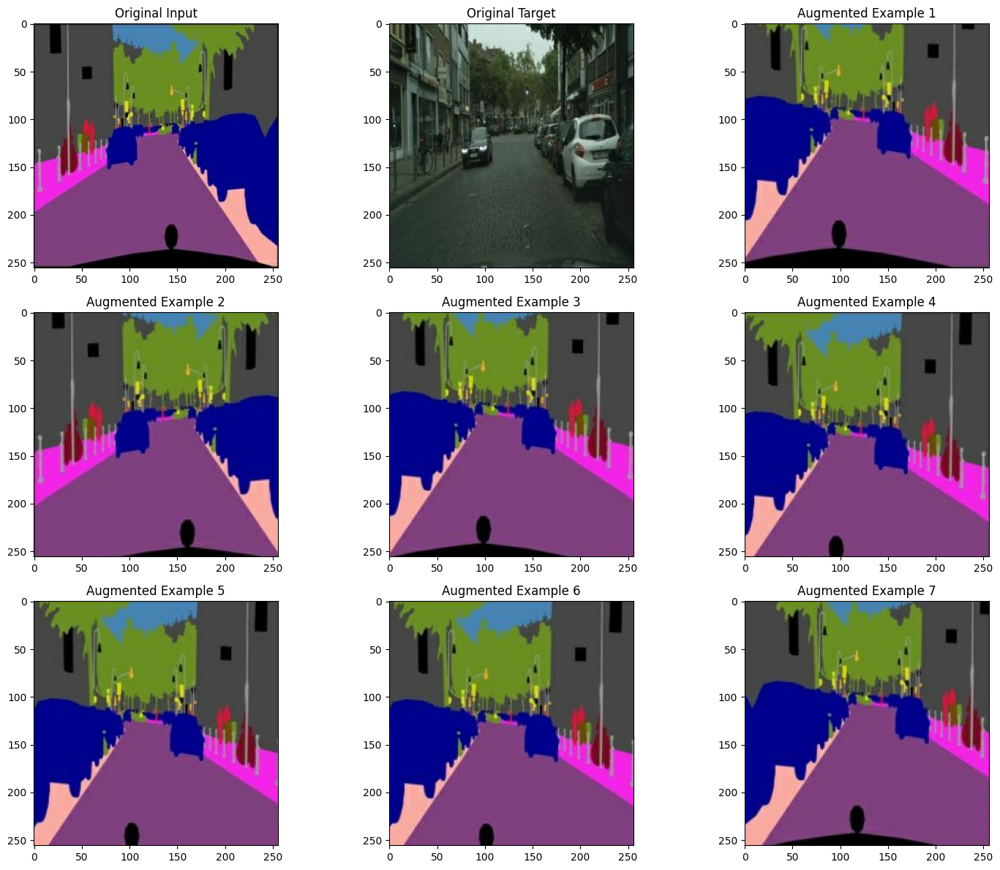

In [11]:
# --- Figure 2: Data Augmentation Examples (for report) ---
plt.figure(figsize=(15, 12))

# Original image
plt.subplot(3, 3, 1)
plt.title("Original Input")
plt.imshow(input_image / 255.0)

plt.subplot(3, 3, 2)
plt.title("Original Target")
plt.imshow(real_image / 255.0)

# Augmented examples
for i in range(7):
    augmented_input, augmented_target = random_jitter(input_image, real_image)
    plt.subplot(3, 3, i+3)
    plt.title(f"Augmented Example {i+1}")
    plt.imshow(augmented_input / 255.0)

plt.tight_layout()
plt.savefig('figures/fig2_data_augmentation.png', bbox_inches='tight')
plt.show()

In [12]:
# --- Create train/test datasets ---
BUFFER_SIZE = 400
BATCH_SIZE = 1

train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test).batch(BATCH_SIZE)

print("Train dataset size:", len(list(train_dataset)))
print("Test dataset size:", len(list(test_dataset)))

Train dataset size: 2975
Test dataset size: 500


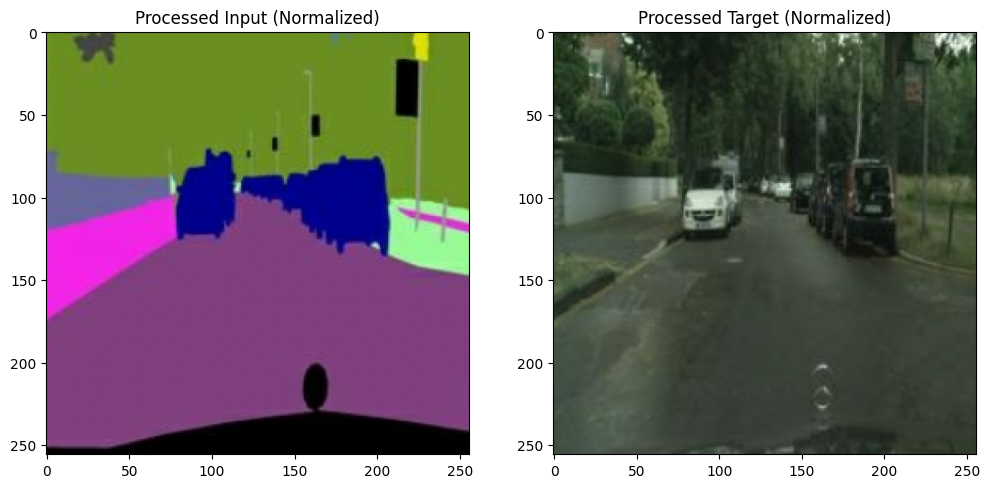

Task 1 completed: Dataset built and visualizations saved for the report


In [13]:
# --- Figure 3: Sample Batch Visualization (for report) ---
# Show a sample from the dataset after all preprocessing
plt.figure(figsize=(12, 6))
for inp, tar in train_dataset.take(1):
    plt.subplot(1, 2, 1)
    plt.title("Processed Input (Normalized)")
    # Convert from [-1,1] to [0,1] for display
    plt.imshow(inp[0] * 0.5 + 0.5)

    plt.subplot(1, 2, 2)
    plt.title("Processed Target (Normalized)")
    plt.imshow(tar[0] * 0.5 + 0.5)

plt.savefig('figures/fig3_processed_sample.png', bbox_inches='tight')
plt.show()

print("Task 1 completed: Dataset built and visualizations saved for the report")

# Task 2
Design and implement the Generator and Discriminator Networks

In [ ]:
# Ensure figures directory exists
if not os.path.exists('figures'):
    os.makedirs('figures')


In [ ]:
# ===========================
# Generator Implementation
# ===========================

# Define the Output Channels (RGB = 3)
OUTPUT_CHANNELS = 3

# Downsampling block for generator (encoder)
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

# Upsampling block for generator (decoder)
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

# Build the Generator (U-Net architecture)
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Encoder (downsampling path)
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),  # (bs, 64, 64, 128)
        downsample(256, 4),  # (bs, 32, 32, 256)
        downsample(512, 4),  # (bs, 16, 16, 512)
        downsample(512, 4),  # (bs, 8, 8, 512)
        downsample(512, 4),  # (bs, 4, 4, 512)
        downsample(512, 4),  # (bs, 2, 2, 512)
        downsample(512, 4),  # (bs, 1, 1, 512)
    ]

    # Decoder (upsampling path)
    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
        upsample(512, 4),  # (bs, 16, 16, 1024)
        upsample(256, 4),  # (bs, 32, 32, 512)
        upsample(128, 4),  # (bs, 64, 64, 256)
        upsample(64, 4),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# Create the generator model
generator = Generator()
print("Generator created successfully")

Generator created successfully


In [ ]:
# ===========================
# Discriminator Implementation
# ===========================

# Build the Discriminator (PatchGAN classifier)
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

# Create the discriminator model
discriminator = Discriminator()
print("Discriminator created successfully")

# Print model summaries
print("\n===== Generator Summary =====")
generator.summary()
print("\n===== Discriminator Summary =====")
discriminator.summary()

Discriminator created successfully

===== Generator Summary =====


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)


===== Discriminator Summary =====


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      6,144 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_17[0]… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 31, 31,    │  2,097,152 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 31, 31,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 33, 33,    │          0 │ leaky_re_lu_11[0… │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 30, 30, 1) │      8,193 │ zero_padding2d_1… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,770,433 (10.57 MB)

 Trainable params: 2,768,641 (10.56 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [ ]:
# ===========================
# Model Testing and Visualization
# ===========================

# Get a sample from the test dataset
sample_input = None
sample_target = None

for example_input, example_target in test_dataset.take(1):
    sample_input = example_input
    sample_target = example_target

# Generate output from untrained generator
gen_output = generator(sample_input, training=False)

# Get output from untrained discriminator
disc_out = discriminator([sample_input, sample_target], training=False)


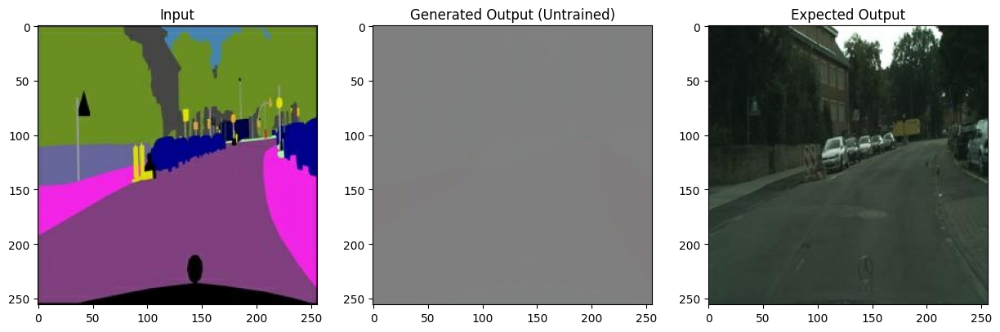

In [ ]:
# Figure 6: Visualize untrained generator output
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Input")
plt.imshow(sample_input[0] * 0.5 + 0.5)  # Denormalize for display
plt.subplot(1, 3, 2)
plt.title("Generated Output (Untrained)")
plt.imshow(gen_output[0] * 0.5 + 0.5)  # Denormalize for display
plt.subplot(1, 3, 3)
plt.title("Expected Output")
plt.imshow(sample_target[0] * 0.5 + 0.5)  # Denormalize for display
plt.savefig('figures/fig6_untrained_generator_output.png', bbox_inches='tight')
plt.show()

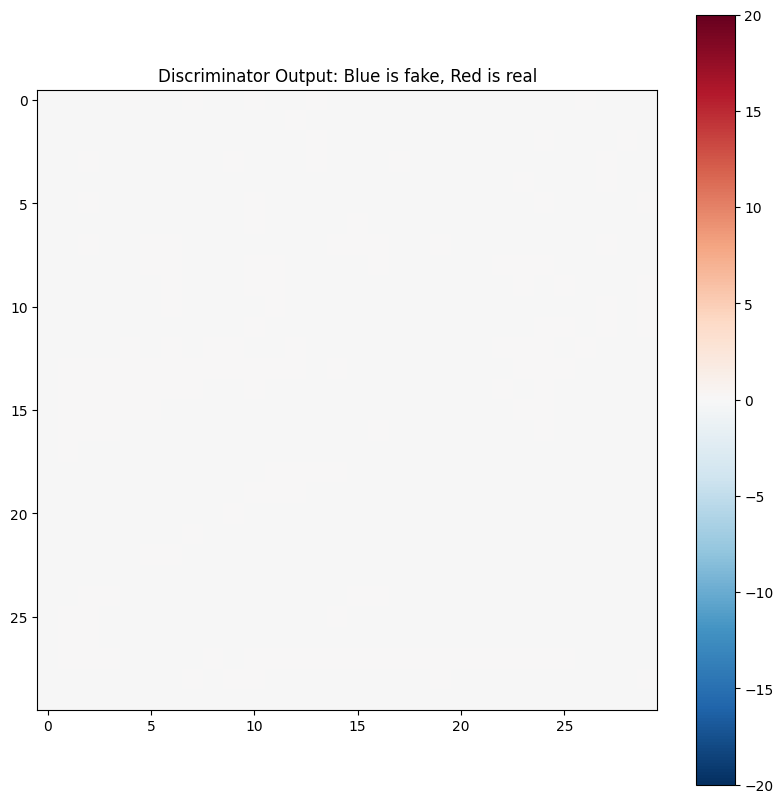

In [ ]:
# Figure 7: Visualize discriminator output
plt.figure(figsize=(10, 10))
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()
plt.title("Discriminator Output: Blue is fake, Red is real")
plt.savefig('figures/fig7_discriminator_output.png', bbox_inches='tight')
plt.show()

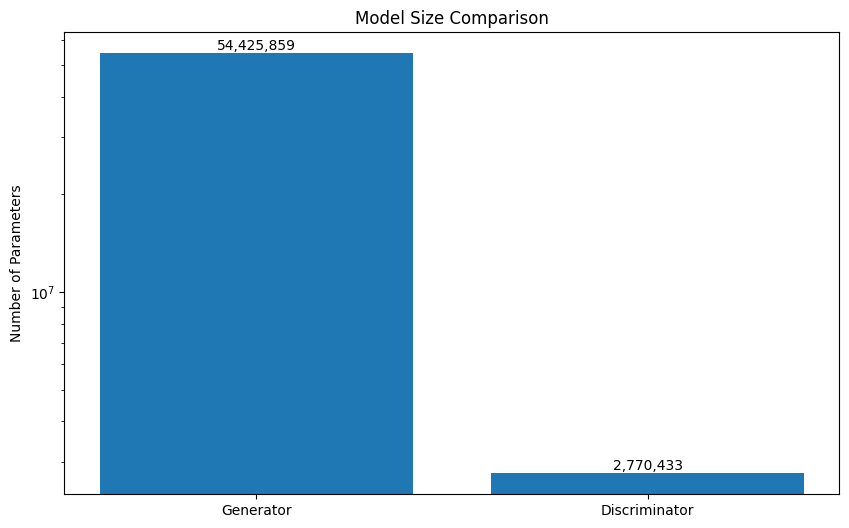

Task 2 completed: Models built and visualizations saved for the report


In [ ]:
# Figure 8: Create a model size comparison chart
gen_params = generator.count_params()
disc_params = discriminator.count_params()

plt.figure(figsize=(10, 6))
plt.bar(['Generator', 'Discriminator'], [gen_params, disc_params])
plt.title('Model Size Comparison')
plt.ylabel('Number of Parameters')
plt.yscale('log')  # Log scale for better visualization
for i, v in enumerate([gen_params, disc_params]):
    plt.text(i, v, f"{v:,}", ha='center', va='bottom')
plt.savefig('figures/fig8_model_parameters.png', bbox_inches='tight')
plt.show()

print("Task 2 completed: Models built and visualizations saved for the report")

# Task 3
Implement the training pipeline, including loss functions and optimization

In [ ]:
# Ensure figures directory exists
if not os.path.exists('figures'):
    os.makedirs('figures')

if not os.path.exists('figures/training_progress'):
    os.makedirs('figures/training_progress')

if not os.path.exists('checkpoints'):
    os.makedirs('checkpoints')


In [ ]:
# Set hyperparameters
LAMBDA = 100
EPOCHS = 150
BATCH_SIZE = 1
checkpoint_dir = './checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

# Set up TensorBoard logging
log_dir = "logs/"
summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
# --- Loss Functions ---
def generator_loss(disc_generated_output, gen_output, target):
    # Adversarial loss (uses mean instead of sum for stability)
    gan_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction='mean')(
        tf.ones_like(disc_generated_output), disc_generated_output)

    # L1 loss (absolute difference between generated and target)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    # Total generator loss
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    # Real loss (want discriminator to output 1 for real images)
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction='mean')(
        tf.ones_like(disc_real_output), disc_real_output)

    # Generated loss (want discriminator to output 0 for generated images)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction='mean')(
        tf.zeros_like(disc_generated_output), disc_generated_output)

    # Total discriminator loss
    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [ ]:
# Define optimizers with appropriate learning rates
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Define checkpoint manager
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator)
checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=5)

# Save a checkpoint if one doesn't exist
if not os.listdir(checkpoint_dir):
    checkpoint_manager.save()

In [ ]:
# Function to generate and save images during training
def generate_and_save_images(model, test_input, tar, epoch=None, step=None):
    # Generate images
    prediction = model(test_input, training=False)

    plt.figure(figsize=(15, 5))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        # Scale images to [0,1] range
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.title(title[i])
        plt.axis('off')

    if epoch is not None:
        save_path = f'figures/training_progress/epoch_{epoch}.png'
    elif step is not None:
        save_path = f'figures/training_progress/step_{step}.png'
    else:
        save_path = 'figures/training_progress/latest.png'

    plt.savefig(save_path, bbox_inches='tight')
    plt.close()

In [ ]:
# Optimized training step with TensorBoard logging
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate fake image
        gen_output = generator(input_image, training=True)

        # Get discriminator outputs
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        # Calculate losses
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    # Calculate gradients
    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply gradient clipping for stability
    generator_gradients = [tf.clip_by_norm(g, 1.0) for g in generator_gradients]
    discriminator_gradients = [tf.clip_by_norm(g, 1.0) for g in discriminator_gradients]

    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    # Log metrics to TensorBoard
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss



In [ ]:
# Optimized training function
def fit(train_ds, test_ds, steps):
    # Get a sample test batch for visualization
    example_input, example_target = next(iter(test_ds.take(1)))

    # Generate initial images to see untrained model's output
    generate_and_save_images(generator, example_input, example_target, step=0)

    # Start training
    start_time = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        # Training step
        gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = train_step(input_image, target, step)

        # Progress monitoring
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start_time:.2f} sec\n')

            start_time = time.time()

            # Generate and save progress images
            generate_and_save_images(generator, example_input, example_target, step=step)
            print(f"Step: {step//1000}k")
            print(f"Generator Loss: {gen_total_loss:.4f}")
            print(f"Discriminator Loss: {disc_loss:.4f}")

        # Progress indicator
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)

        # Save checkpoint every 5k steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

    # Training complete
    total_time = time.time() - start_time
    print(f"\nTraining complete! Total time: {total_time:.2f} seconds")

    # Generate final images
    generate_and_save_images(generator, example_input, example_target, step=steps)

    return {
        'total_time': total_time,
        'final_gen_loss': gen_total_loss,
        'final_disc_loss': disc_loss
    }


In [ ]:
# Loss function diagram visualization
def visualize_loss_functions():
    plt.figure(figsize=(12, 8))

    # Create a subplot for the generator loss
    plt.subplot(2, 1, 1)
    plt.title('Generator Loss Components', fontsize=14)

    # Create dummy data
    x = np.linspace(0, 1, 100)
    l1_loss = 2 * x  # Simplified L1 loss visualization
    adv_loss = -np.log(x + 0.01)  # Simplified adversarial loss
    total_loss = adv_loss + LAMBDA * l1_loss  # Combined loss

    plt.plot(x, adv_loss, 'b-', label='Adversarial Loss')
    plt.plot(x, LAMBDA * l1_loss, 'g-', label=f'L1 Loss (λ={LAMBDA})')
    plt.plot(x, total_loss, 'r-', label='Total Generator Loss')
    plt.xlabel('Discriminator Output (D(G(x)))', fontsize=12)
    plt.ylabel('Loss Value', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Create a subplot for the discriminator loss
    plt.subplot(2, 1, 2)
    plt.title('Discriminator Loss Components', fontsize=14)

    # For real images (target=1)
    real_loss = -np.log(x + 0.01)
    # For fake images (target=0)
    fake_loss = -np.log(1 - x + 0.01)
    # Total discriminator loss
    disc_loss = 0.5 * (real_loss + fake_loss)

    plt.plot(x, real_loss, 'b-', label='Real Loss (-log(D(x)))')
    plt.plot(x, fake_loss, 'g-', label='Fake Loss (-log(1-D(G(x))))')
    plt.plot(x, disc_loss, 'r-', label='Total Discriminator Loss')
    plt.xlabel('Discriminator Output', fontsize=12)
    plt.ylabel('Loss Value', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('figures/fig11_loss_functions.png', bbox_inches='tight')
    plt.show()

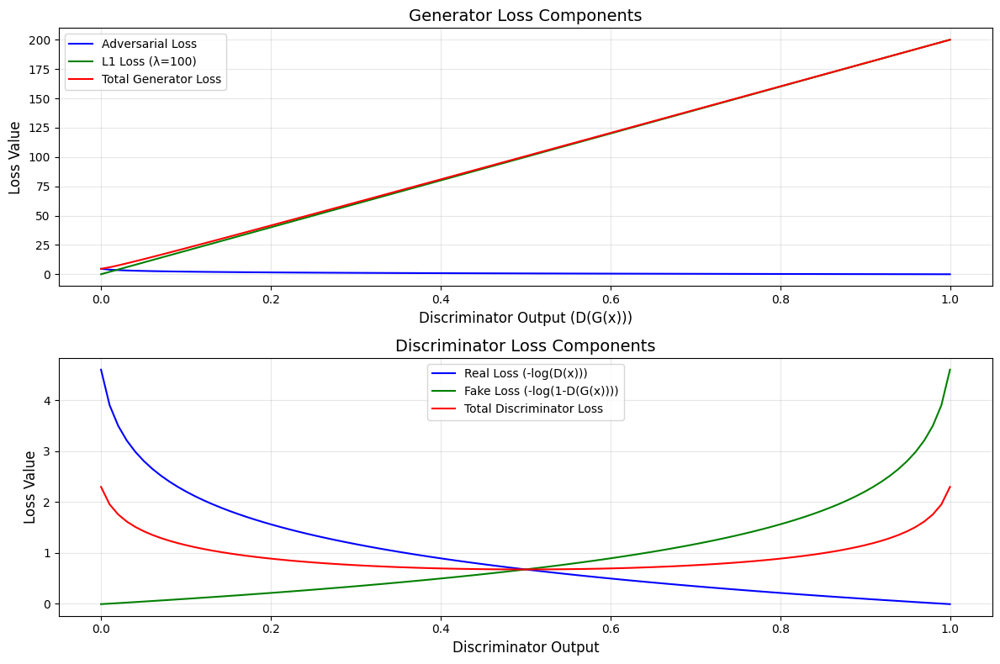

In [ ]:
# Create loss function diagram
visualize_loss_functions()


In [ ]:
# Execute training
print("Starting training process...")
print("This will take some time - expect at least 1-2 hours for meaningful results")
history = fit(train_dataset, test_dataset, steps=40000)
print(f"Training completed in {history['total_time']:.2f} seconds")


Time taken for 1000 steps: 119.50 sec

Step: 39k
Generator Loss: 28.8138
Discriminator Loss: 0.9045
....................................................................................................
Training complete! Total time: 130.47 seconds
Training completed in 130.47 seconds


In [ ]:
# After training is complete, visualize the trained discriminator output
def visualize_discriminator_output():
    # Get a sample from test dataset
    for input_image, target in test_dataset.take(1):
        break

    # Generate image with trained generator
    generated_image = generator(input_image, training=False)

    # Get discriminator outputs for both real and fake pairs
    real_output = discriminator([input_image, target], training=False)
    fake_output = discriminator([input_image, generated_image], training=False)

    # Reshape and normalize discriminator outputs for visualization
    real_output_map = tf.squeeze(real_output).numpy()
    fake_output_map = tf.squeeze(fake_output).numpy()

    # Create visualization
    plt.figure(figsize=(20, 10))

    # Show input and output images
    plt.subplot(2, 3, 1)
    plt.title('Input Map')
    plt.imshow(input_image[0] * 0.5 + 0.5)
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.title('Ground Truth')
    plt.imshow(target[0] * 0.5 + 0.5)
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title('Generated Image')
    plt.imshow(generated_image[0] * 0.5 + 0.5)
    plt.axis('off')

    # Show discriminator outputs
    plt.subplot(2, 3, 5)
    plt.title('Discriminator Output (Real Pair)')
    plt.imshow(real_output_map, cmap='viridis')
    plt.colorbar(label='Confidence (logits)')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.title('Discriminator Output (Fake Pair)')
    plt.imshow(fake_output_map, cmap='viridis')
    plt.colorbar(label='Confidence (logits)')
    plt.axis('off')

    plt.suptitle('Trained Discriminator Analysis', fontsize=16)
    plt.savefig('figures/fig12_trained_discriminator_output.png', bbox_inches='tight')
    plt.show()


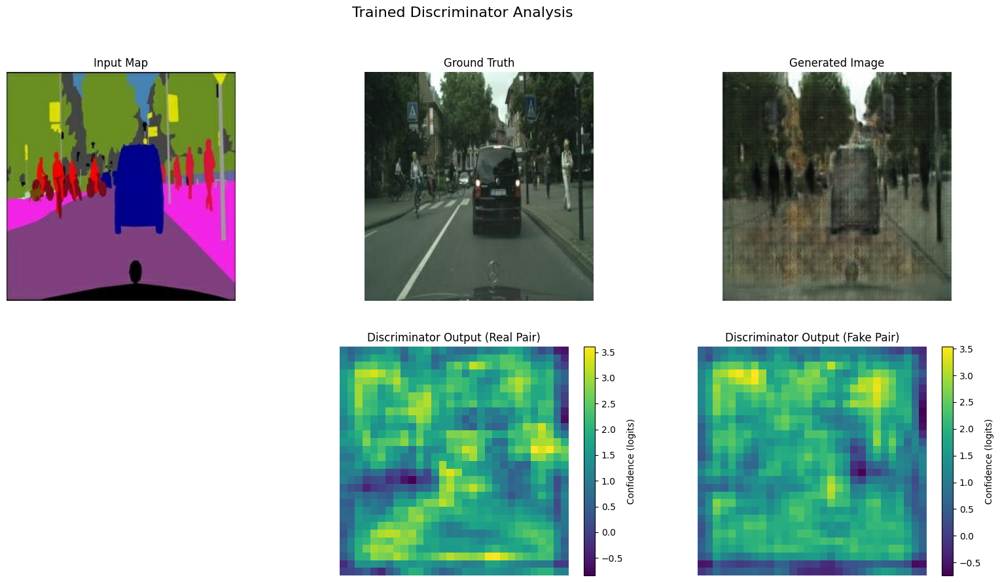

In [ ]:
# Visualize discriminator output
visualize_discriminator_output()

In [ ]:
# Restore the generator weights from the latest checkpoint
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir)).expect_partial()
print("Checkpoint restored for evaluation!")


Checkpoint restored for evaluation!


# Task 4
Evaluate the trained generator on test images

In [ ]:
# Create directory for test results if it doesn't exist
if not os.path.exists('figures/test_results'):
    os.makedirs('figures/test_results')

In [ ]:
import cv2
total_ssim = 0
total_l1 = 0
num_samples = 0

# Evaluate on 50 test images
for idx, (input_image, target) in enumerate(test_dataset.take(50)):
    prediction = generator(input_image, training=False)

    # seperate predicted image for Task 5
    # Create directory for predicted images if it doesn't exist
    predicted_dir = 'figures/pix2pix_predicted'
    if not os.path.exists(predicted_dir):
        os.makedirs(predicted_dir)

    # Save the predicted image directly
    pred_img = prediction[0].numpy()  # Remove batch dimension
    pred_img = (pred_img * 0.5 + 0.5) * 255  # Denormalize if needed
    pred_img = pred_img.astype(np.uint8)
    cv2.imwrite(os.path.join(predicted_dir, f'pred_{idx+1}.png'), cv2.cvtColor(pred_img, cv2.COLOR_RGB2BGR))

    plt.figure(figsize=(15, 5))
    display_list = [input_image[0], target[0], prediction[0]]
    title = ['Input', 'Ground Truth', 'Predicted Image']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.savefig(f'figures/test_results/test_sample_{idx+1}.png', bbox_inches='tight')
    plt.close()

    # Metrics
    pred_norm = (prediction[0] * 0.5 + 0.5).numpy()
    target_norm = (target[0] * 0.5 + 0.5).numpy()
    ssim_value = ssim(target_norm, pred_norm, channel_axis=2, data_range=1.0, win_size=5)
    l1_value = np.mean(np.abs(target_norm - pred_norm))
    total_ssim += ssim_value
    total_l1 += l1_value
    num_samples += 1

    if (idx + 1) % 10 == 0:
        print(f"Processed {idx + 1} test samples...")

avg_ssim = total_ssim / num_samples
avg_l1 = total_l1 / num_samples

print("\nTest Set Evaluation Results:")
print(f"Average SSIM: {avg_ssim:.4f}")
print(f"Average L1 Loss: {avg_l1:.4f}")

with open('figures/test_results/evaluation_metrics.txt', 'w') as f:
    f.write(f"Test Set Evaluation Results:\n")
    f.write(f"Number of samples evaluated: {num_samples}\n")
    f.write(f"Average SSIM: {avg_ssim:.4f}\n")
    f.write(f"Average L1 Loss: {avg_l1:.4f}\n")

print("Task 4 complete! Images and metrics saved in figures/test_results/")

Processed 10 test samples...
Processed 20 test samples...
Processed 30 test samples...
Processed 40 test samples...
Processed 50 test samples...

Test Set Evaluation Results:
Average SSIM: 0.3887
Average L1 Loss: 0.1228
Task 4 complete! Images and metrics saved in figures/test_results/


# Task 5
Apply model adaptation or fine-tuning techniques to improve the performance of a pretrained YOLO model**

## Yolov5 setup


In [1]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17430, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 17430 (delta 76), reused 29 (delta 29), pack-reused 17329 (from 2)
Receiving objects: 100% (17430/17430), 16.31 MiB | 23.03 MiB/s, done.
Resolving deltas: 100% (11949/11949), done.


In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd yolov5

/content/yolov5


In [4]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 65.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [5]:
from google.colab import files
import os
print("upload one image for testing\n")
uploaded = files.upload()

for original_filename, content in uploaded.items():
    new_filename = 'test_image.png'
    with open(new_filename, 'wb') as f:
        f.write(content)
    print(f'Uploaded file "{original_filename}" saved as "{new_filename}"')
    break

upload one image for testing



Saving pred_20.png to pred_20.png
Uploaded file "pred_20.png" saved as "test_image.png"


In [7]:
!python detect.py --source test_image.png

detect: weights=yolov5s.pt, source=test_image.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 /content/yolov5/test_image.png: 640x640 3 persons, 1 bird, 12.2ms
Speed: 0.6ms pre-process, 12.2ms inference, 126.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


Latest folder found: runs/detect/exp2
Files found: ['test_image.png']
Displaying test_image.png


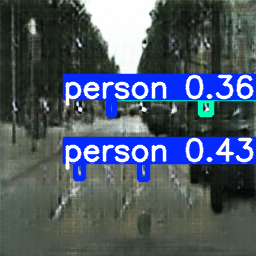

In [8]:
import os
import re
from IPython.display import Image, display

base_dir = 'runs/detect'

# List all folders starting with 'exp' or 'exp' + number
exp_folders = [
    f for f in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, f)) and re.match(r'exp(\d*)$', f)
]

if not exp_folders:
    raise FileNotFoundError(f"No 'exp*' folders found in {base_dir}")

# Extract number after 'exp'; if none, treat as 0
def exp_number(folder_name):
    match = re.match(r'exp(\d*)$', folder_name)
    return int(match.group(1)) if match and match.group(1) else 0

# Sort folders by extracted number
exp_folders_sorted = sorted(exp_folders, key=exp_number)

# Pick the latest folder (highest number)
latest_exp_folder = exp_folders_sorted[-1]

result_dir = os.path.join(base_dir, latest_exp_folder)
print(f"Latest folder found: {result_dir}")

# List and display image files
files = os.listdir(result_dir)
print("Files found:", files)

for file in files:
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):
        print(f"Displaying {file}")
        display(Image(filename=os.path.join(result_dir, file)))

## Test-Time Augmentation incorporation

In [9]:
!python detect.py --weights yolov5s.pt --img 832 --source test_image.png --augment

detect: weights=['yolov5s.pt'], source=test_image.png, data=data/coco128.yaml, imgsz=[832, 832], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 /content/yolov5/test_image.png: 832x832 3 persons, 1 boat, 1 traffic light, 2 birds, 89.9ms
Speed: 0.9ms pre-process, 89.9ms inference, 132.9ms NMS per image at shape (1, 3, 832, 832)
Results saved to runs/detect/exp3


Latest folder found: runs/detect/exp3
Files found: ['test_image.png']
Displaying test_image.png


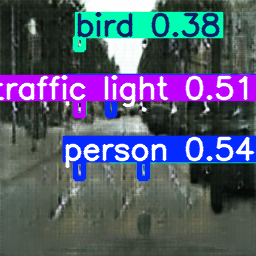

In [10]:
import os
import re
from IPython.display import Image, display

base_dir = 'runs/detect'

# List all folders starting with 'exp' or 'exp' + number
exp_folders = [
    f for f in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, f)) and re.match(r'exp(\d*)$', f)
]

if not exp_folders:
    raise FileNotFoundError(f"No 'exp*' folders found in {base_dir}")

# Extract number after 'exp'; if none, treat as 0
def exp_number(folder_name):
    match = re.match(r'exp(\d*)$', folder_name)
    return int(match.group(1)) if match and match.group(1) else 0

# Sort folders by extracted number
exp_folders_sorted = sorted(exp_folders, key=exp_number)

# Pick the latest folder (highest number)
latest_exp_folder = exp_folders_sorted[-1]

result_dir = os.path.join(base_dir, latest_exp_folder)
print(f"Latest folder found: {result_dir}")

# List and display image files
files = os.listdir(result_dir)
print("Files found:", files)

for file in files:
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):
        print(f"Displaying {file}")
        display(Image(filename=os.path.join(result_dir, file)))

## Data augmentation

In [11]:

from google.colab import files
import os
print('Please upload a valid PyTorch weight file with ".pt" extension.\n')
uploaded = files.upload()

for original_filename, content in uploaded.items():
    # Check if the uploaded file is a .pt file
    if original_filename.endswith('.pt'):
        new_filename = 'my_custom_weight.pt'
        with open(new_filename, 'wb') as f:
            f.write(content)
        print(f'Uploaded file "{original_filename}" saved as "{new_filename}".')
    else:
        print(f'Warning: The uploaded file "{original_filename}" does not have a ".pt" extension.')
        print('Please upload a valid PyTorch weight file with ".pt" extension.')
    break  # Only process the first uploaded file

Please upload a valid PyTorch weight file with ".pt" extension.



Saving best.pt to best.pt
Uploaded file "best.pt" saved as "my_custom_weight.pt".


In [12]:
import os
from ultralytics import YOLO
import cv2

output_dir = '/content/val'
os.makedirs(output_dir, exist_ok=True)

# Path to your image
image_path = 'test_image.png'

# Load the image
frame = cv2.imread(image_path)
if frame is None:
    raise FileNotFoundError(f"Image not found: {image_path}")

# Load your YOLO model
model_path = 'my_custom_weight.pt'
model = YOLO(model_path)  # load a custom model

threshold = 0.5

# Run inference on the image
results = model(frame)[0]

# Draw bounding boxes and labels on the image
for result in results.boxes.data.tolist():
    x1, y1, x2, y2, score, class_id = result
    if score > threshold:
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 4)
        cv2.putText(frame, results.names[int(class_id)].upper(), (int(x1), int(y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0, 255, 0), 3, cv2.LINE_AA)

# Save or display the result
output_path = os.path.join(output_dir, os.path.basename(image_path).replace('.jpg', '_out.jpg'))
cv2.imwrite(output_path, frame)
print(f"Output saved to {output_path}")


0: 640x640 4 cars, 9.5ms
Speed: 5.1ms preprocess, 9.5ms inference, 133.3ms postprocess per image at shape (1, 3, 640, 640)
Output saved to /content/val/test_image.png


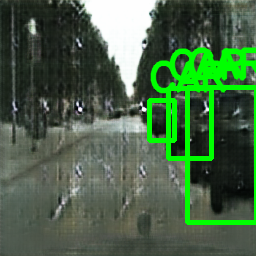

In [13]:
from IPython.display import Image, display

display(Image(filename='/content/val/test_image.png'))

In [14]:
from google.colab import files
import os

print("Input all the images you would like to detect \n")

# Create 'images_gen' directory if it doesn't exist
os.makedirs('images_gen', exist_ok=True)

# Delete all existing files in 'images_gen' folder
for existing_file in os.listdir('images_gen'):
    file_path = os.path.join('images_gen', existing_file)
    if os.path.isfile(file_path):
        os.remove(file_path)
print("Cleared existing files in 'images_gen' folder.\n")

# Upload multiple files
uploaded = files.upload()

# Save each uploaded file into 'images_gen' folder
for filename, filecontent in uploaded.items():
    file_path = os.path.join('images_gen', filename)
    with open(file_path, 'wb') as f:
        f.write(filecontent)
    print(f'Saved file "{filename}" to "{file_path}"')

# List files in 'images_gen' folder to confirm
print("\nFiles in 'images_gen' folder:")
!ls images_gen

Input all the images you would like to detect 

Cleared existing files in 'images_gen' folder.



Saving pred_1.png to pred_1.png
Saving pred_2.png to pred_2.png
Saving pred_3.png to pred_3.png
Saving pred_4.png to pred_4.png
Saving pred_5.png to pred_5.png
Saving pred_6.png to pred_6.png
Saving pred_7.png to pred_7.png
Saving pred_8.png to pred_8.png
Saving pred_9.png to pred_9.png
Saving pred_10.png to pred_10.png
Saving pred_11.png to pred_11.png
Saving pred_12.png to pred_12.png
Saving pred_13.png to pred_13.png
Saving pred_14.png to pred_14.png
Saving pred_15.png to pred_15.png
Saving pred_16.png to pred_16.png
Saving pred_17.png to pred_17.png
Saving pred_18.png to pred_18.png
Saving pred_19.png to pred_19.png
Saving pred_20.png to pred_20 (1).png
Saving pred_21.png to pred_21.png
Saving pred_22.png to pred_22.png
Saving pred_23.png to pred_23.png
Saving pred_24.png to pred_24.png
Saving pred_25.png to pred_25.png
Saving pred_26.png to pred_26.png
Saving pred_27.png to pred_27.png
Saving pred_28.png to pred_28.png
Saving pred_29.png to pred_29.png
Saving pred_30.png to pred_3

In [15]:
import os
import glob
from ultralytics import YOLO
import cv2

# Input folder with images

input_folder = '/content/yolov5/images_gen'

# Output folder to save results
output_folder = '/content/val'
for existing_file in os.listdir('/content/val'):
    file_path = os.path.join('/content/val', existing_file)
    if os.path.isfile(file_path):
        os.remove(file_path)
print("Cleared existing files in '/content/val' folder.\n")
os.makedirs(output_folder, exist_ok=True)

# Load your custom YOLOv5 model weights
model_path = 'my_custom_weight.pt'
model = YOLO(model_path)

threshold = 0.5

# Loop over all JPG and PNG images in the input folder
image_paths = glob.glob(os.path.join(input_folder, '*.jpg')) + glob.glob(os.path.join(input_folder, '*.png'))

for image_path in image_paths:
    frame = cv2.imread(image_path)
    if frame is None:
        continue

    orig_h, orig_w = frame.shape[:2]

    # Resize for inference
    inference_size = (320, 320)
    frame_resized = cv2.resize(frame, inference_size)

    results = model(frame_resized)[0]

    # Scale boxes from resized to original image size
    x_scale = orig_w / inference_size[0]
    y_scale = orig_h / inference_size[1]

    for result in results.boxes.data.tolist():
        x1, y1, x2, y2, score, class_id = result
        if score > threshold:
            # Scale coordinates back to original
            x1 = int(x1 * x_scale)
            y1 = int(y1 * y_scale)
            x2 = int(x2 * x_scale)
            y2 = int(y2 * y_scale)

            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 4)
            cv2.putText(frame, results.names[int(class_id)].upper(), (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0, 255, 0), 3, cv2.LINE_AA)

    # Save original size image with boxes
    filename = os.path.basename(image_path)
    output_path = os.path.join(output_folder, filename.replace('.jpg', '_out.jpg').replace('.png', '_out.png'))
    cv2.imwrite(output_path, frame)
    print(f"Saved {output_path}")

Cleared existing files in '/content/val' folder.


0: 640x640 1 car, 9.7ms
Speed: 2.6ms preprocess, 9.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/val/pred_37_out.png

0: 640x640 3 cars, 7.1ms
Speed: 3.4ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/val/pred_24_out.png

0: 640x640 6 cars, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/val/pred_13_out.png

0: 640x640 (no detections), 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/val/pred_5_out.png

0: 640x640 1 car, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/val/pred_7_out.png

0: 640x640 5 cars, 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/val/pred_18_out.png

0:

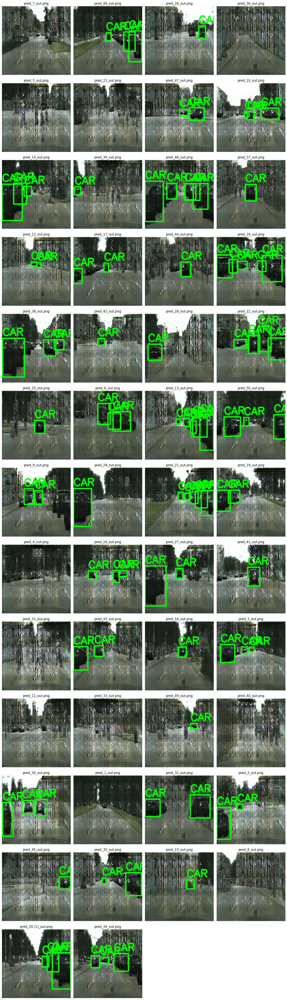

In [16]:
import os
from matplotlib import pyplot as plt
from PIL import Image

image_dir = '/content/val/'

image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

cols = 4
rows = (len(image_files) + cols - 1) // cols

plt.figure(figsize=(15, 4 * rows))

for i, img_file in enumerate(image_files):
    img_path = os.path.join(image_dir, img_file)
    img = Image.open(img_path)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_file)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Task 6

In [17]:
import os
import glob
from ultralytics import YOLO
import cv2
import json

# Function to process images and perform object detection
def process_images(input_folder, output_folder, model, threshold=0.5):
    os.makedirs(output_folder, exist_ok=True)
    predictions = []

    image_paths = glob.glob(os.path.join(input_folder, '*.jpg')) + glob.glob(os.path.join(input_folder, '*.png'))

    for image_path in image_paths:
        frame = cv2.imread(image_path)
        if frame is None:
            continue

        orig_h, orig_w = frame.shape[:2]
        inference_size = (320, 320)
        frame_resized = cv2.resize(frame, inference_size)

        results = model(frame_resized)[0]
        x_scale = orig_w / inference_size[0]
        y_scale = orig_h / inference_size[1]

        image_predictions = {'image': os.path.basename(image_path), 'boxes': []}

        for result in results.boxes.data.tolist():
            x1, y1, x2, y2, score, class_id = result
            if score > threshold:
                x1 = int(x1 * x_scale)
                y1 = int(y1 * y_scale)
                x2 = int(x2 * x_scale)
                y2 = int(y2 * y_scale)

                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 4)
                cv2.putText(frame, results.names[int(class_id)].upper(), (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0, 255, 0), 3, cv2.LINE_AA)

                image_predictions['boxes'].append({
                    'class': results.names[int(class_id)],
                    'coordinates': [x1, y1, x2, y2],
                    'score': score
                })

        filename = os.path.basename(image_path)
        output_path = os.path.join(output_folder, filename.replace('.jpg', '_out.jpg').replace('.png', '_out.png'))
        cv2.imwrite(output_path, frame)
        print(f"Saved {output_path}")

        predictions.append(image_predictions)

    return predictions

In [18]:
# Input and output folders
input_folder = '/content/yolov5/images_gen'
output_folder_predictions = '/content/prediction'
output_folder_ground_truth = '/content/ground_truth'

# Load YOLO model
model_path = '/content/yolov5/yolov5s.pt'
model = YOLO(model_path)

# Load custom YOLO model for ground truth
model_path_custom = 'my_custom_weight.pt'
model_custom = YOLO(model_path_custom)

# Process images for predictions
predictions = process_images(input_folder, output_folder_predictions, model_custom)

# Save predictions to a JSON file
with open(os.path.join(output_folder_predictions, 'predictions.json'), 'w') as f:
    json.dump(predictions, f, indent=4)

# Process images for ground truth
ground_truth = process_images(input_folder, output_folder_ground_truth, model)

# Save ground truth to a JSON file
with open(os.path.join(output_folder_ground_truth, 'ground_truth.json'), 'w') as f:
    json.dump(ground_truth, f, indent=4)

PRO TIP 💡 Replace 'model=/content/yolov5/yolov5s.pt' with new 'model=/content/yolov5/yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 17.7M/17.7M [00:00<00:00, 120MB/s] 



0: 640x640 1 car, 9.4ms
Speed: 2.9ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/prediction/pred_37_out.png

0: 640x640 3 cars, 7.5ms
Speed: 3.1ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/prediction/pred_24_out.png

0: 640x640 6 cars, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/prediction/pred_13_out.png

0: 640x640 (no detections), 7.1ms
Speed: 3.1ms preprocess, 7.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/prediction/pred_5_out.png

0: 640x640 1 car, 7.1ms
Speed: 3.4ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/prediction/pred_7_out.png

0: 640x640 5 cars, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Saved /content/prediction/pred_18_out.png

0: 640x640

In [19]:
import json
import numpy as np

# Load predictions
with open('/content/prediction/predictions.json') as f:
    predictions = json.load(f)

# Load ground truth data
with open('/content/ground_truth/ground_truth.json') as f:
    ground_truth = json.load(f)

def iou(box1, box2):
    x1_inter = max(box1[0], box2[0])
    y1_inter = max(box1[1], box2[1])
    x2_inter = min(box1[2], box2[2])
    y2_inter = min(box1[3], box2[3])

    inter_area = max(0, x2_inter - x1_inter) * max(0, y2_inter - y1_inter)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    return inter_area / float(box1_area + box2_area - inter_area)

# Initialize metrics
all_detections = {}
all_ground_truths = {}

# Prepare detections and ground truths
for pred in predictions:
    image_name = pred['image']
    for box in pred['boxes']:
        class_id = box['class']
        all_detections.setdefault(class_id, []).append((image_name, box['coordinates'], box['score']))

for gt in ground_truth:
    image_name = gt['image']
    for box in gt['boxes']:
        class_id = box['class']
        all_ground_truths.setdefault(class_id, []).append((image_name, box['coordinates']))

# Calculate mAP
def calculate_map():
    mAP = 0.0
    num_classes = len(all_detections)

    for class_id in all_detections:
        detections = sorted(all_detections[class_id], key=lambda x: x[2], reverse=True)
        gt_count = len(all_ground_truths.get(class_id, []))
        true_positive = np.zeros(len(detections))
        false_positive = np.zeros(len(detections))
        matched_gt = set()

        for i, (image_name, pred_box, _) in enumerate(detections):
            found_match = False
            for j, (gt_image_name, gt_box) in enumerate(all_ground_truths.get(class_id, [])):
                if image_name == gt_image_name and j not in matched_gt and iou(pred_box, gt_box) > 0.5:
                    true_positive[i] = 1
                    matched_gt.add(j)
                    found_match = True
                    break
            if not found_match:
                false_positive[i] = 1

        # Calculate precision and recall
        cum_tp = np.cumsum(true_positive)
        cum_fp = np.cumsum(false_positive)
        precision = cum_tp / (cum_tp + cum_fp) if (cum_tp + cum_fp).any() else 0
        recall = cum_tp / gt_count if gt_count > 0 else 0

        # Calculate Average Precision (AP)
        ap = sum(np.max(precision[recall >= t]) / 11 for t in np.arange(0.0, 1.1, 0.1) if (recall >= t).any())
        mAP += ap

    return mAP / num_classes if num_classes > 0 else 0

# Initialize overall metrics
tp = fp = fn = 0

# Evaluation
for pred in predictions:
    image_name = pred['image']
    pred_boxes = pred['boxes']
    gt_boxes = next((item['boxes'] for item in ground_truth if item['image'] == image_name), [])

    matched = set()
    for p in pred_boxes:
        found_match = False
        for idx, g in enumerate(gt_boxes):
            if idx not in matched and p['class'] == g['class'] and iou(p['coordinates'], g['coordinates']) > 0.5:
                tp += 1
                matched.add(idx)
                found_match = True
                break
        if not found_match:
            fp += 1

    fn += len(gt_boxes) - len(matched)

# Calculate metrics
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
mean_ap = calculate_map()

# Print results
print(f"Precision: {precision:.5f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"Mean Average Precision (mAP): {mean_ap:.4f}")

Precision: 0.03333
Recall: 0.1111
F1 Score: 0.0513
Mean Average Precision (mAP): 0.0417
